In [1]:
import numpy as np
import matplotlib.pyplot as plt
import h5py

## Get the Data

In [ ]:
from cmass.bias.tools.hod import lookup_hod_model

def get_hod_params(hod_seed):
    model = lookup_hod_model(
            model='zheng07zinterp',
            assem_bias=True,
            vel_assem_bias=True,
            zpivot=[0.45, 0.55, 0.65]
        )

    np.random.seed(hod_seed)
    model.sample_parameters()
    param_dict = model.get_parameters()

    return np.array(list(param_dict.values()))

In [ ]:
f = h5py.File(f'/home/x-csui/workspace/cmass/cmass_data/fastpm_3gpc_hodz/0/mtng_lightcone/hod00000_aug00000.h5','r')
zs = f['z'][:]
counts, bins = np.histogram(zs, bins= 100)

In [14]:
nzs = []
hod_params = []
for i in range(2000):
    for hod in range(1,6):
        hod_idx = i*10 + hod
        try:
            f = h5py.File(f'/home/x-csui/workspace/cmass/cmass_data/fastpm_3gpc_hodz/{i}/mtng_lightcone/hod{hod_idx:05}_aug00000.h5','r')
        except:
            print(i,hod_idx,'not found')
            continue
        
        zs = f['z'][:]
        counts, _ = np.histogram(zs, bins= bins)

        hod_param = get_hod_params(hod_idx)
        nzs.append(counts)
        hod_params.append(hod_param)
        f.close()
        print(i,hod_idx)

0 1
0 2
0 3
0 4
0 5
1 11
1 12
1 13
1 14
1 15
2 21
2 22
2 23
2 24
2 25
3 31
3 32
3 33
3 34
3 35
4 41
4 42
4 43
4 44
4 45
5 51
5 52
5 53
5 54
5 55
6 61
6 62
6 63
6 64
6 65
7 71
7 72
7 73
7 74
7 75
8 81
8 82
8 83
8 84
8 85
9 91
9 92
9 93
9 94
9 95
10 101
10 102


10 103
10 104
10 105
11 111
11 112
11 113
11 114
11 115
12 121
12 122
12 123
12 124
12 125
13 131
13 132
13 133
13 134
13 135
14 141
14 142
14 143
14 144
14 145
15 151
15 152
15 153
15 154
15 155
16 161
16 162
16 163
16 164
16 165
17 171
17 172
17 173
17 174
17 175
18 181
18 182
18 183
18 184
18 185
19 191
19 192
19 193
19 194
19 195
20 201
20 202
20 203
20 204
20 205
21 211
21 212
21 213
21 214
21 215
22 221
22 222
22 223
22 224
22 225
23 231
23 232
23 233
23 234
23 235
24 241
24 242
24 243
24 244
24 245
25 251
25 252
25 253
25 254
25 255
26 261
26 262
26 263
26 264
26 265
27 271
27 272
27 273
27 274
27 275
28 281
28 282
28 283
28 284
28 285
29 291
29 292
29 293
29 294
29 295
30 301
30 302
30 303
30 304
30 305
31 311
31 312
31 313
31 314
31 315
32 321
32 322
32 323
32 324
32 325
33 331
33 332
33 333
33 334
33 335
34 341
34 342
34 343
34 344
34 345
35 351
35 352
35 353
35 354
35 355
36 361
36 362
36 363
36 364
36 365
37 371
37 372
37 373
37 374
37 375
38 381
38 382
38 383
38 384
38 385

In [15]:
nzs = np.array(nzs)
hod_params = np.array(hod_params)

In [16]:
nzs.shape, hod_params.shape

((9795, 100), (9795, 16))

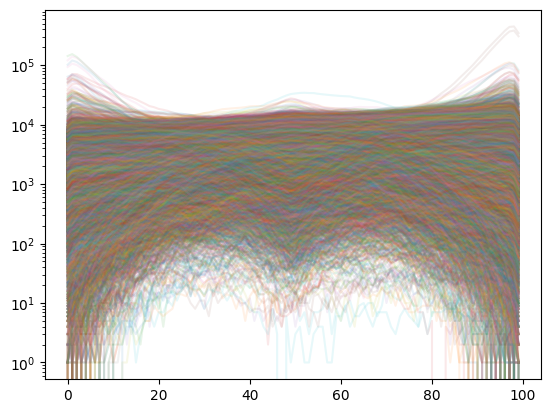

In [17]:
plt.plot(nzs.T, alpha=0.1);
plt.yscale('log')

In [18]:
np.save('/home/x-csui/workspace/cmass/cmass_data/dataset/nz_hod_inference/nzs.npy', nzs)
np.save('/home/x-csui/workspace/cmass/cmass_data/dataset/nz_hod_inference/hod_params.npy', hod_params)

## Do inference

In [3]:
nzs = np.load('/home/x-csui/workspace/cmass/cmass_data/dataset/nz_hod_inference/nzs.npy')
hod_params = np.load('/home/x-csui/workspace/cmass/cmass_data/dataset/nz_hod_inference/hod_params.npy')

In [4]:
#train eval split
from sklearn.model_selection import train_test_split
nzs_train, nzs_test,params_train,params_test = train_test_split(nzs, hod_params, test_size=0.1, random_state=0)

In [5]:
import warnings
warnings.filterwarnings('ignore')
import matplotlib.colors as mcolors

import ili
from ili.dataloaders import NumpyLoader
from ili.inference import InferenceRunner
from ili.validation.metrics import PosteriorCoverage, PlotSinglePosterior

import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', device)

Device: cpu


In [6]:
loader = NumpyLoader(x=nzs_train, theta=params_train)

In [9]:
# define a prior
prior = ili.utils.Uniform(low=hod_params.min(axis=0), high=hod_params.max(axis=0), device=device)

# instantiate your neural networks to be used as an ensemble
nets = [
    ili.utils.load_nde_sbi(engine='NPE', model='maf', hidden_features=50, num_transforms=5),
     ili.utils.load_nde_sbi(engine='NPE', model='maf', hidden_features=50, num_transforms=5),
    ili.utils.load_nde_sbi(engine='NPE', model='maf', hidden_features=50, num_transforms=5)
]

# define training arguments
train_args = {
    'training_batch_size': 64,
    'learning_rate': 1e-4
}

# initialize the trainer
runner = InferenceRunner.load(
    backend='sbi',
    engine='NPE',
    prior=prior,
    nets=nets,
    device=device,
    train_args=train_args,
    proposal=None,
    out_dir=None
)
# train the model
posterior_ensemble, summaries = runner(loader=loader)

INFO:root:MODEL INFERENCE CLASS: NPE
INFO:root:Training model 1 / 3.


 Neural network successfully converged after 313 epochs.

INFO:root:Training model 2 / 3.


 Training neural network. Epochs trained: 197

INFO:root:Training model 3 / 3.


 Training neural network. Epochs trained: 222198 epochs.

INFO:root:It took 920.6504988670349 seconds to train models.


 Neural network successfully converged after 223 epochs.

In [ ]:
# torch.save(posterior_ensemble, '/home/x-csui/workspace/cmass/cmass_data/dataset/nz_hod_inference/models/nz_to_hod_3models.pth')

In [ ]:
# posterior_ensemble = torch.load('/home/x-csui/workspace/cmass/cmass_data/dataset/nz_hod_inference/models/nz_to_hod_3models.pth')

In [11]:
def sample_posterior(posterior, n_samples,cond,true_params):

    total_pos_samples = np.zeros((n_samples,true_params.shape[0],true_params.shape[1]))

    for i in range(true_params.shape[0]):
        total_pos_samples[:,i,:] = posterior.sample((n_samples,),x= cond[i],show_progress_bars=False).detach().cpu().numpy()
    
    return total_pos_samples

def evaluate_posterior(posterior, x, theta):
    log_prob = posterior.log_prob(theta=theta, x=x)
    return log_prob.mean().item()

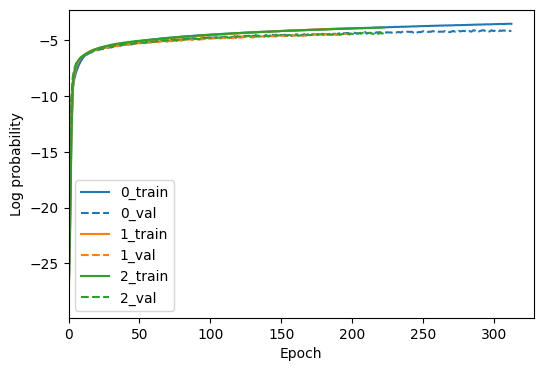

In [12]:
# plot train/validation loss
fig, ax = plt.subplots(1, 1, figsize=(6,4))
c = list(mcolors.TABLEAU_COLORS)
for i, m in enumerate(summaries):
    ax.plot(m['training_log_probs'], ls='-', label=f"{i}_train", c=c[i])
    ax.plot(m['validation_log_probs'], ls='--', label=f"{i}_val", c=c[i])
ax.set_xlim(0)
ax.set_xlabel('Epoch')
ax.set_ylabel('Log probability')
ax.legend()

Drawing 449 posterior samples:   0%|          | 0/449 [00:00<?, ?it/s]

Drawing 250 posterior samples:   0%|          | 0/250 [00:00<?, ?it/s]

Drawing 301 posterior samples:   0%|          | 0/301 [00:00<?, ?it/s]

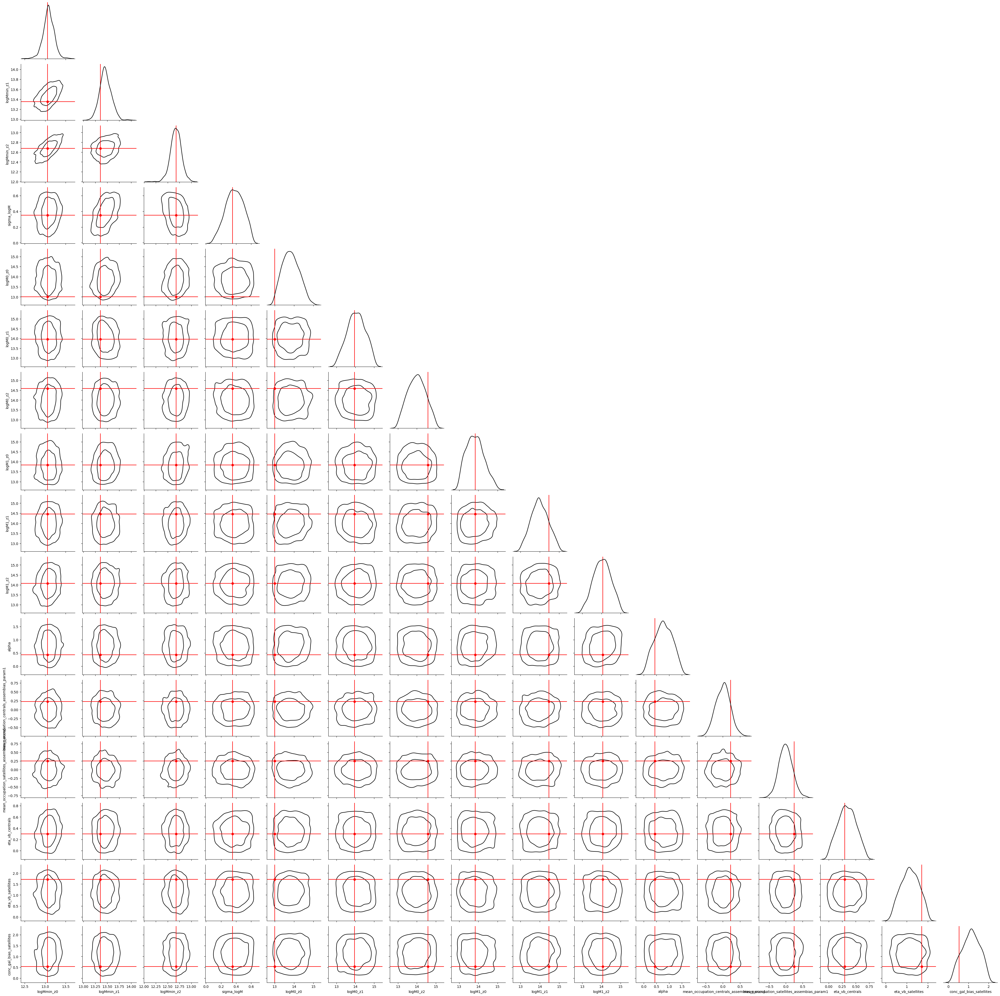

In [17]:
ind = np.random.randint(0, len(params_test))
# use ltu-ili's built-in validation metrics to plot the posterior for this point
metric = PlotSinglePosterior(
    num_samples=1000, sample_method='direct', 
    labels=['logMmin_z0',
            'logMmin_z1',
            'logMmin_z2',
            'sigma_logM',
            'logM0_z0',
            'logM0_z1',
            'logM0_z2',
            'logM1_z0',
            'logM1_z1',
            'logM1_z2',
            'alpha',
            'mean_occupation_centrals_assembias_param1',
            'mean_occupation_satellites_assembias_param1',
            'eta_vb_centrals',
            'eta_vb_satellites',
            'conc_gal_bias_satellites'])

fig = metric(
    posterior=posterior_ensemble,
    x_obs = nzs_test[ind], theta_fid=params_test[ind]
)

100%|██████████| 980/980 [08:25<00:00,  1.94it/s]


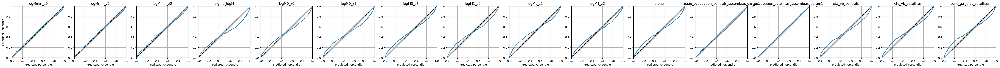

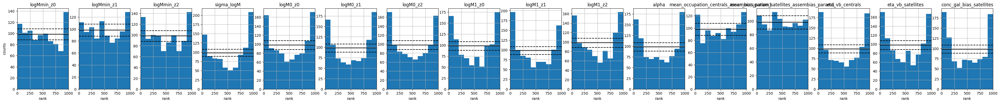

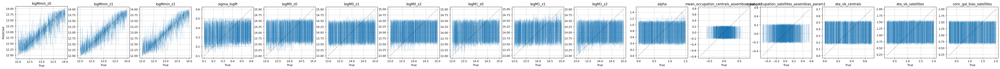

In [18]:
# Drawing samples from the ensemble posterior

metric = PosteriorCoverage(
    num_samples=1000, sample_method='direct', 
    labels=['logMmin_z0',
            'logMmin_z1',
            'logMmin_z2',
            'sigma_logM',
            'logM0_z0',
            'logM0_z1',
            'logM0_z2',
            'logM1_z0',
            'logM1_z1',
            'logM1_z2',
            'alpha',
            'mean_occupation_centrals_assembias_param1',
            'mean_occupation_satellites_assembias_param1',
            'eta_vb_centrals',
            'eta_vb_satellites',
            'conc_gal_bias_satellites'],
    plot_list = ["coverage", "histogram", "predictions"],
    out_dir=None
)

fig = metric(
    posterior=posterior_ensemble, # NeuralPosteriorEnsemble instance from sbi package
    x=nzs_test, theta=params_test
)

## Apply to real data

In [7]:
mtng_lightcone = h5py.File('/anvil/scratch/x-mho1/cmass-ili/mtng/nbody/L3000-N384/0/mtng_lightcone/hod00000_aug00000.h5', 'r')

In [8]:
nz_mtng_target = mtng_lightcone['z'][:]

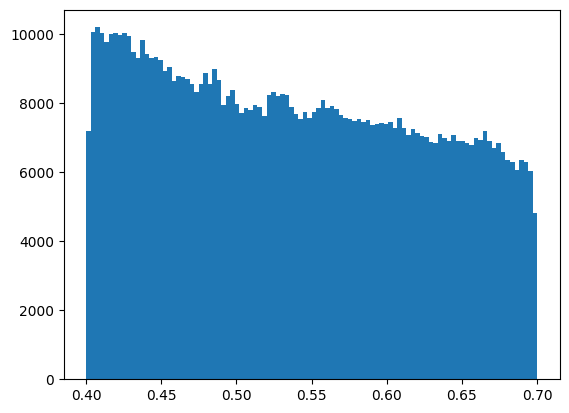

In [9]:
plt.hist(nz_mtng_target, bins=100);

In [10]:
counts_target, bins = np.histogram(nz_mtng_target, bins=100)

In [25]:
np.save('/home/x-csui/workspace/cmass/cmass_data/dataset/nz_hod_inference/mtng_nz.npy', counts_target)

Drawing 401 posterior samples:   0%|          | 0/401 [00:00<?, ?it/s]

Drawing 285 posterior samples:   0%|          | 0/285 [00:00<?, ?it/s]

Drawing 314 posterior samples:   0%|          | 0/314 [00:00<?, ?it/s]

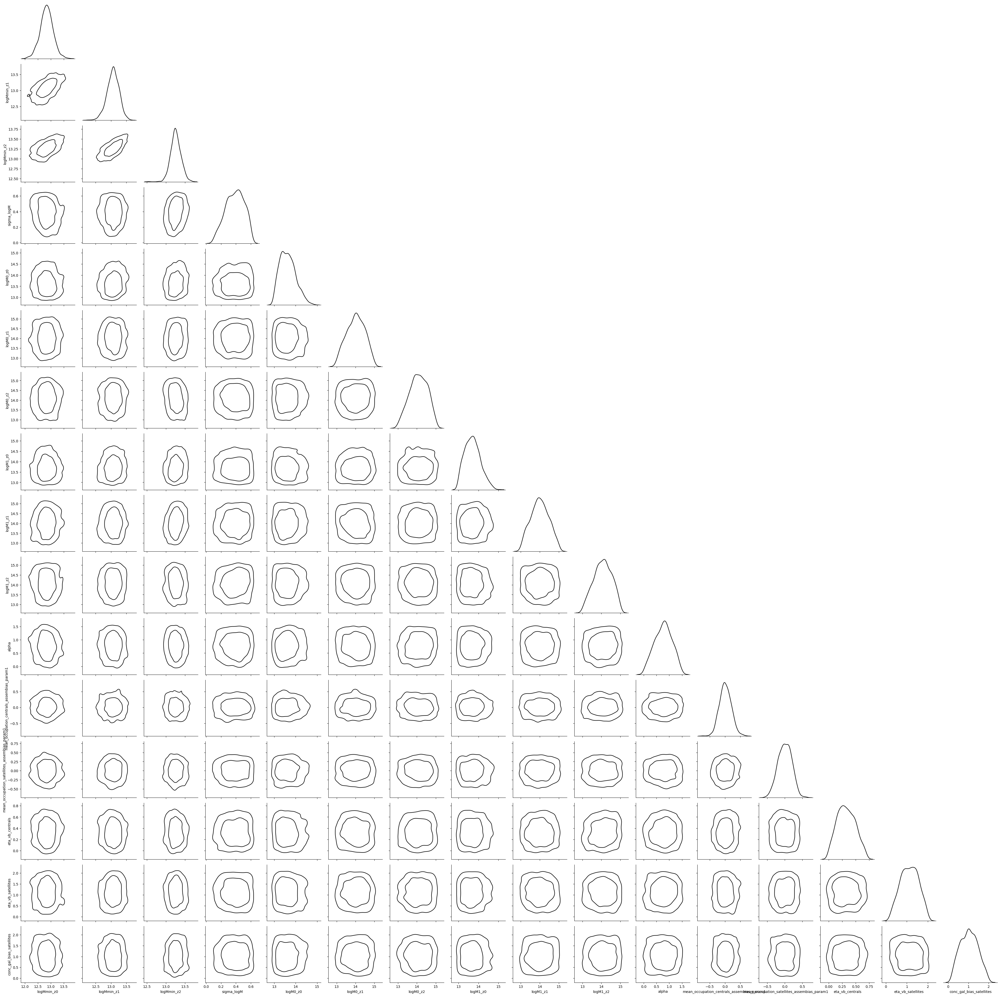

In [26]:
ind = np.random.randint(0, len(params_test))
# use ltu-ili's built-in validation metrics to plot the posterior for this point
metric = PlotSinglePosterior(
    num_samples=1000, sample_method='direct', 
        labels=['logMmin_z0',
            'logMmin_z1',
            'logMmin_z2',
            'sigma_logM',
            'logM0_z0',
            'logM0_z1',
            'logM0_z2',
            'logM1_z0',
            'logM1_z1',
            'logM1_z2',
            'alpha',
            'mean_occupation_centrals_assembias_param1',
            'mean_occupation_satellites_assembias_param1',
            'eta_vb_centrals',
            'eta_vb_satellites',
            'conc_gal_bias_satellites'],
)
fig = metric(
    posterior=posterior_ensemble,
    x_obs = counts_target, theta_fid=None
)

In [11]:
pos_samples_mtng = posterior_ensemble.sample((30000,),x= counts_target,show_progress_bars=False).detach().cpu().numpy()

In [14]:
from corner import corner

In [20]:
prior_range = [hod_params.min(axis=0), hod_params.max(axis=0)]
prior_range = np.array(prior_range).T

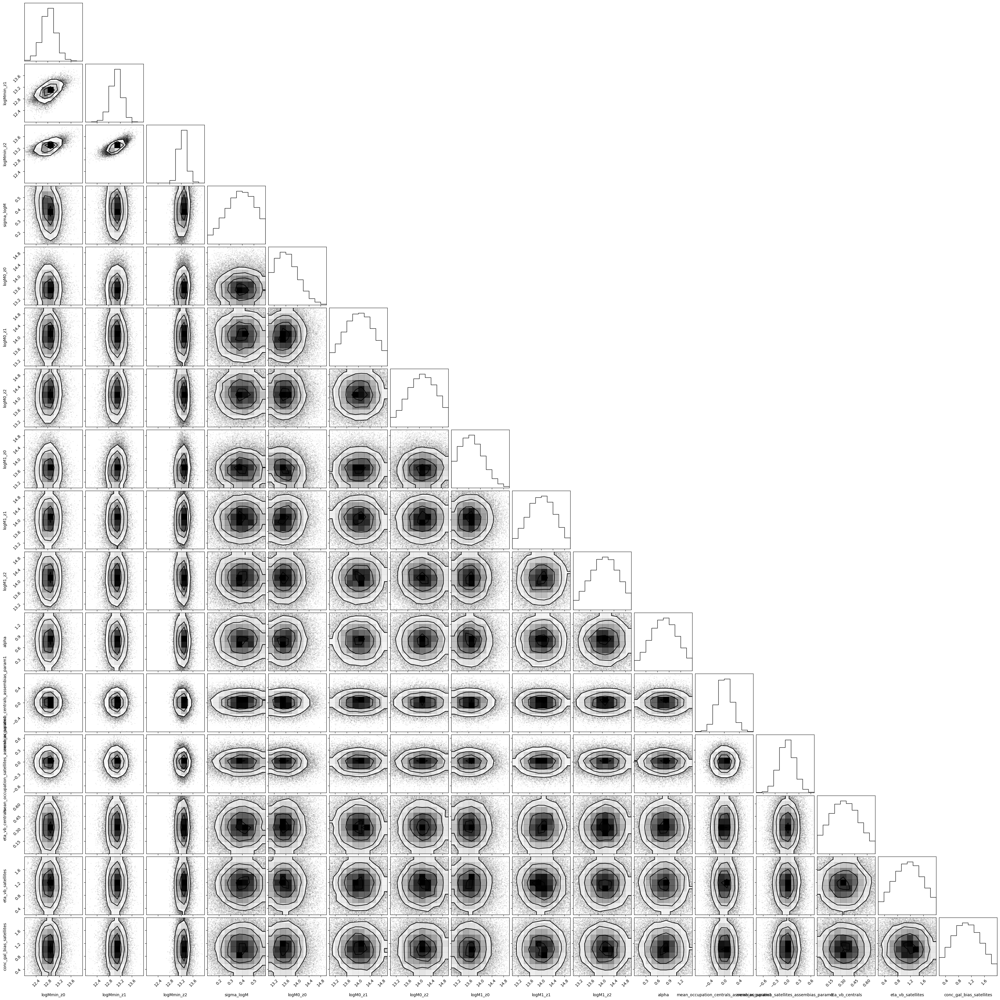

In [22]:
corner(pos_samples_mtng, labels=['logMmin_z0',
            'logMmin_z1',
            'logMmin_z2',
            'sigma_logM',
            'logM0_z0',
            'logM0_z1',
            'logM0_z2',
            'logM1_z0',
            'logM1_z1',
            'logM1_z2',
            'alpha',
            'mean_occupation_centrals_assembias_param1',
            'mean_occupation_satellites_assembias_param1',
            'eta_vb_centrals',
            'eta_vb_satellites',
            'conc_gal_bias_satellites'],bins=10,range=prior_range);

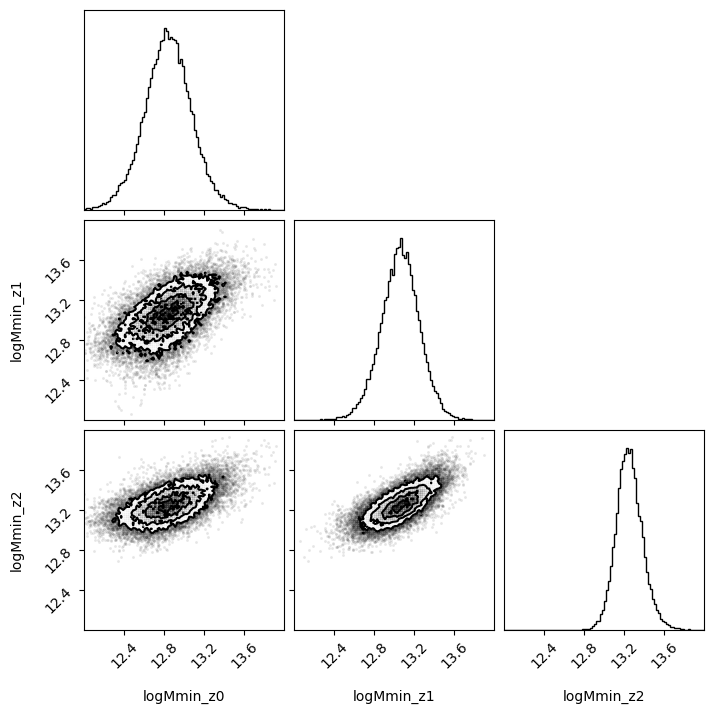

In [29]:
corner(pos_samples_mtng[:,:3], labels=['logMmin_z0',
            'logMmin_z1',
            'logMmin_z2',],bins=100,range=prior_range[:3]);

In [23]:
np.save('/home/x-csui/workspace/cmass/cmass_data/dataset/nz_hod_inference/pos/mtng_hod_pos.npy',pos_samples_mtng)